# GRADCAM

Taking the code from session materil

In [2]:
from keras.applications.vgg16 import VGG16, preprocess_input, decode_predictions
from keras.preprocessing import image
import numpy as np
import cv2
import keras.backend as K

Using TensorFlow backend.


1.  Loading helper functions
2.  Load VGG
3. Load Image
4. Rescale image to 224x224x3 (VGG's expectation, why?)
5. Use expand_dims to convert image to a batch of size 1
6. Preprocesing normalizes our input image by subtracting mean RGB values

In [3]:
#Importing image form colab
from google.colab import drive
drive.mount('/content/gdrive')

import os
os.chdir('/content/gdrive/My Drive')



Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/gdrive


In [4]:
model = VGG16(weights="imagenet")
from skimage import io
sg = io.imread("16_scale_tony_stark_avenger3_headscrupt_with_glasses_1534759826_e79b0cf4.jpg")
#dog = "https://www.rspcapetinsurance.org.au/rspca/media/images/hero/dog-insurance-hero.jpg"
sg = cv2.resize(sg, dsize=(224, 224), interpolation=cv2.INTER_CUBIC)
x = image.img_to_array(sg)
x = np.expand_dims(x, axis=0)
x = preprocess_input(x)

W0720 12:29:15.033573 140139485300608 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:74: The name tf.get_default_graph is deprecated. Please use tf.compat.v1.get_default_graph instead.

W0720 12:29:15.079026 140139485300608 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:517: The name tf.placeholder is deprecated. Please use tf.compat.v1.placeholder instead.

W0720 12:29:15.089517 140139485300608 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:4138: The name tf.random_uniform is deprecated. Please use tf.random.uniform instead.

W0720 12:29:15.134939 140139485300608 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:3976: The name tf.nn.max_pool is deprecated. Please use tf.nn.max_pool2d instead.



553467904/553467096 [==============================] - 80s 0us/step


W0720 12:30:37.397224 140139485300608 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:174: The name tf.get_default_session is deprecated. Please use tf.compat.v1.get_default_session instead.

W0720 12:30:37.398750 140139485300608 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:181: The name tf.ConfigProto is deprecated. Please use tf.compat.v1.ConfigProto instead.



1. We get the predictions for the image
2. We take the topmost class index
3. Take output from the final convolutional layer

In [5]:
preds = model.predict(x)
class_idx = np.argmax(preds[0]) 
print(class_idx)
class_output = model.output[:, class_idx]
last_conv_layer = model.get_layer("block5_conv3")

837


1. Compute the gradient of the class output value with respect to the feature map
2. Pool the gradients over all the axies leaving out the channel dimension
3. Weigh the output feature map with the computed gradient values

In [6]:
grads = K.gradients(class_output, last_conv_layer.output)[0]
print(grads.shape)
pooled_grads = K.mean(grads, axis=(0, 1, 2))
print(pooled_grads.shape)
iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0]])

pooled_grads_value, conv_layer_output_value = iterate([x])

for i in range(512):
  conv_layer_output_value[:, :, i] *= pooled_grads_value[i]

(?, 14, 14, 512)
(512,)


1. Average the weighted feature map along the channel dimension resulting in a heat map of size 14x14 
2. Normalize the heat map to make the values between 0 and 1

In [7]:
heatmap = np.mean(conv_layer_output_value, axis = -1)
print(conv_layer_output_value.shape)
print(heatmap.shape)
heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)

(14, 14, 512)
(14, 14)


Show the results

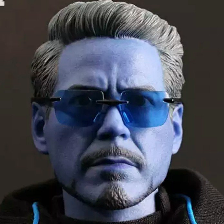

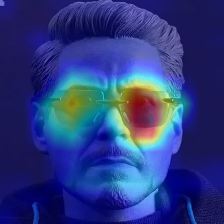

In [8]:
heatmap = cv2.resize(heatmap, (sg.shape[1], sg.shape[0]))
heatmap = np.uint8(255 * heatmap)
heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
superimposed_img = cv2.addWeighted(sg, 0.5, heatmap, 0.5, 0)
from google.colab.patches import cv2_imshow
cv2_imshow( sg)
cv2_imshow(superimposed_img)

In [9]:
print([layer.name for layer in model.layers[0:] if "conv" in layer.name])

['block1_conv1', 'block1_conv2', 'block2_conv1', 'block2_conv2', 'block3_conv1', 'block3_conv2', 'block3_conv3', 'block4_conv1', 'block4_conv2', 'block4_conv3', 'block5_conv1', 'block5_conv2', 'block5_conv3']


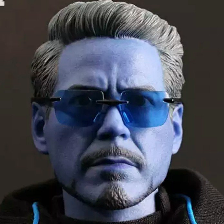

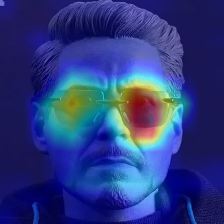

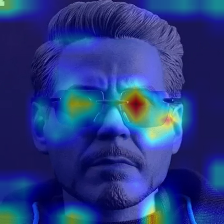

In [11]:
#Build GradCAM images for the one layer before the one we used
last_conv_layer = model.get_layer("block5_conv2")

grads = K.gradients(class_output, last_conv_layer.output)[0]
#print(grads.shape)
pooled_grads = K.mean(grads, axis=(0, 1, 2))
#print(pooled_grads.shape)
iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0]])

pooled_grads_value, conv_layer_output_value = iterate([x])

for i in range(512):
  conv_layer_output_value[:, :, i] *= pooled_grads_value[i]
  
heatmap = np.mean(conv_layer_output_value, axis = -1)
#print(conv_layer_output_value.shape)
#print(heatmap.shape)
heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)

heatmap = cv2.resize(heatmap, (sg.shape[1], sg.shape[0]))
heatmap = np.uint8(255 * heatmap)
heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

superimposed_img2 = cv2.addWeighted(sg, 0.5, heatmap, 0.5, 0)

#and one layer before this one. 
last_conv_layer = model.get_layer("block5_conv1")

grads = K.gradients(class_output, last_conv_layer.output)[0]
#print(grads.shape)
pooled_grads = K.mean(grads, axis=(0, 1, 2))
#print(pooled_grads.shape)
iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0]])

pooled_grads_value, conv_layer_output_value = iterate([x])

for i in range(512):
  conv_layer_output_value[:, :, i] *= pooled_grads_value[i]
  
heatmap = np.mean(conv_layer_output_value, axis = -1)
#print(conv_layer_output_value.shape)
#print(heatmap.shape)
heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)

heatmap = cv2.resize(heatmap, (sg.shape[1], sg.shape[0]))
heatmap = np.uint8(255 * heatmap)
heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

superimposed_img2 = cv2.addWeighted(sg, 0.5, heatmap, 0.5, 0)

from google.colab.patches import cv2_imshow
cv2_imshow( sg)
cv2_imshow(superimposed_img)
cv2_imshow(superimposed_img2)

***Second Part:***
1. Refer to this paper: https://arxiv.org/pdf/1701.03056.pdf (Links to an external site.)
2. Go to page 21, table 7
3. The Receptive field increases from 29 to 45.
4. Explain this increase

Primary observation on Layer 6 and Layer 7 that receptive field increase is strange.

With formula of Rout = Rin + (k - 1) *  Jin receptive filed would be increased frin 29 to 37

But strangly increase is 49 which is double of Jin; if Jin would be calculated as J = Jprevious * stride

The key is 
**ϕi = ϕi−1 + 2^(η−τ) ∗ (Filter size − 1) 
ϕ0 = 1** 
*Where η and τ are the number of strided convolutions and deconvolutional layers*


For this particular reseach paper calculation of receptive field is calculated with different formula mentioned above.

ϕ1 = 1 + 2^(0−0) ∗ (3 − 1) = 3 as number of strided convolutions and deconvolutional layers is 0 and 0 beause no in strided convolution layers

ϕ2 = 3 + 2^(0−0) ∗ (3 − 1) = 5  as number of strided convolutions and deconvolutional layers is 0 and 0 beause no strided convolution layers

ϕ3 = 5 + 2^(1−0) ∗ (3 − 1) = 9  as number of strided convolutions and deconvolutional layers is 1 and 0 beause previous layer was a strided convolution layer

ϕ4 = 9 + 2^(1−0) ∗ (3 − 1) = 13  as number of strided convolutions and deconvolutional layers is 1 and 0 beause no additional in strided convolution layers

ϕ5 = 13 + 2^(2−0) ∗ (3 − 1) = 21  as number of strided convolutions and deconvolutional layers is 2 and 0 beause previous layer was a strided convolution layer, meaning 2 convolution layers previously were strided

ϕ6 = 21 + 2^(2−0) ∗ (3 − 1) = 29  as number of strided convolutions and deconvolutional layers is 2 and 0 beause no additional in strided convolution layers

ϕ7 = 29 + 2^(3−0) ∗ (1 − 1) != 45  as number of strided convolutions and deconvolutional layers is 2 and 0 beause previous layer was a strided convolution layer, meaning 3 convolution layers previously were strided

With this formula to get necessary receptive filed filter size seems to be a key point here; for final layer if by any chance (filter size -1) can be opited we are able to observe the output receptive field. 

Questiion remain ?

In [13]:
!pip install keract

40960/35363 [==================================] - 0s 0us/step


W0720 05:17:10.645370 140011609323392 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/optimizers.py:790: The name tf.train.Optimizer is deprecated. Please use tf.compat.v1.train.Optimizer instead.



Egyptian_cat (47.48035669326782)
input_2:0 (224, 224, 3) -> Skipped. First dimension is not 1.
block1_conv1_1/Relu:0 (1, 224, 224, 64) 


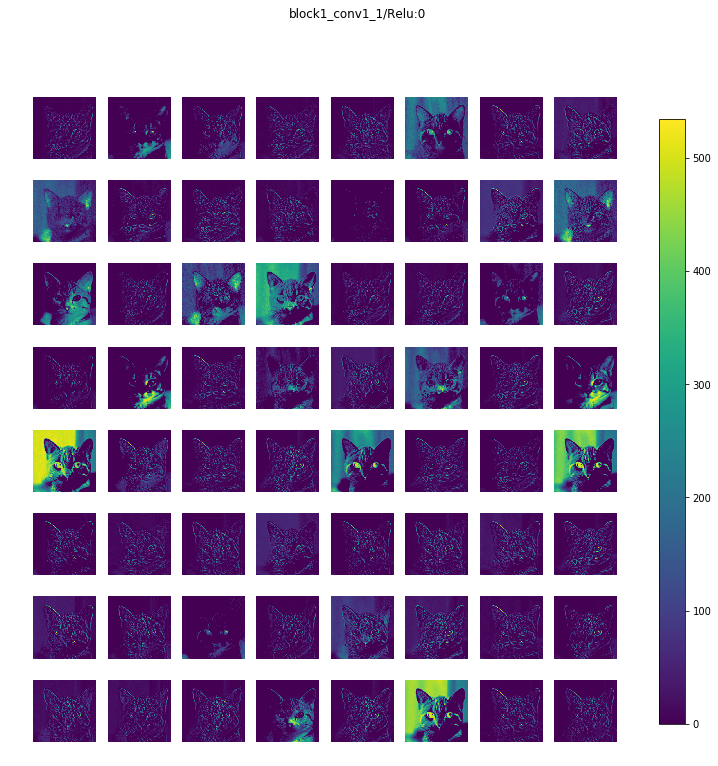

block1_conv2_1/Relu:0 (1, 224, 224, 64) 


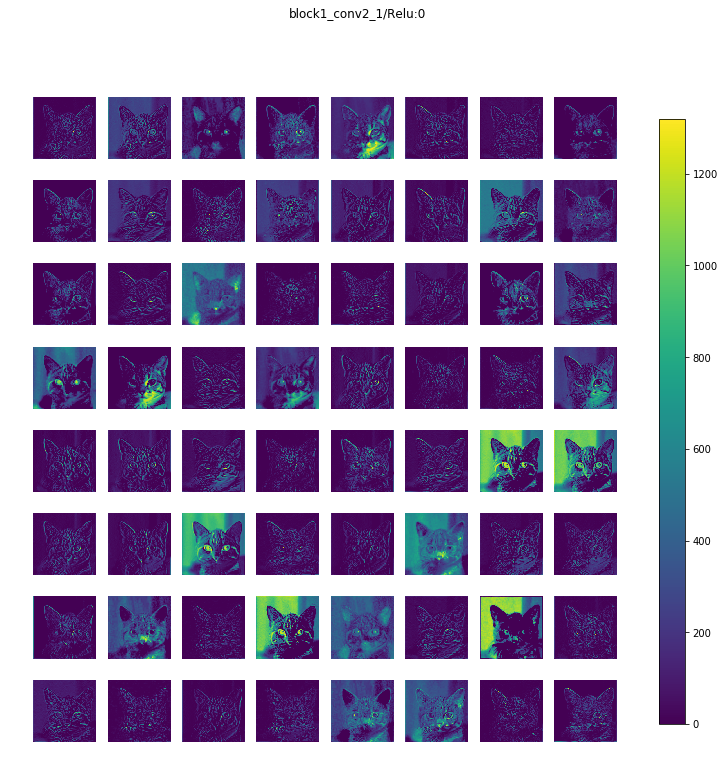

block1_pool_1/MaxPool:0 (1, 112, 112, 64) 


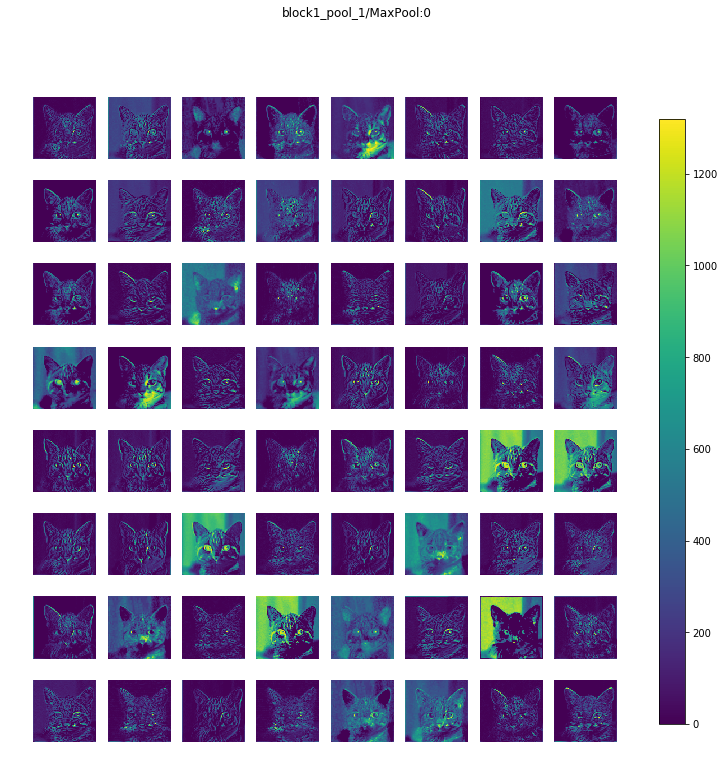

block2_conv1_1/Relu:0 (1, 112, 112, 128) 


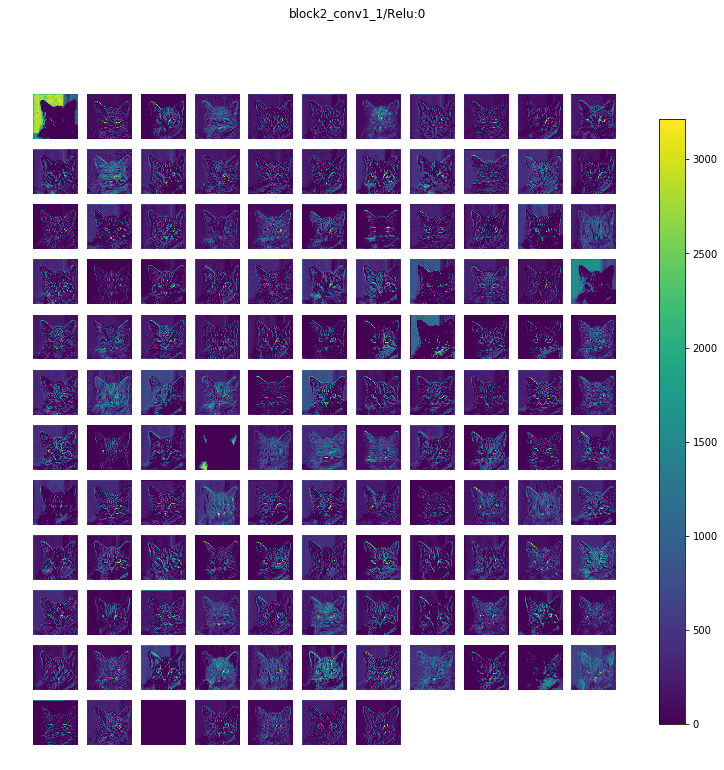

block2_conv2_1/Relu:0 (1, 112, 112, 128) 


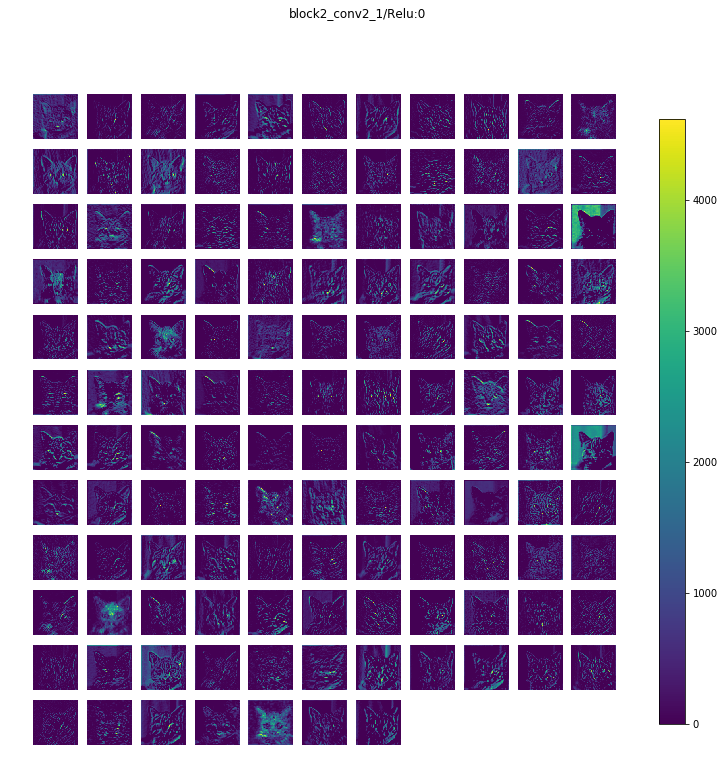

block2_pool_1/MaxPool:0 (1, 56, 56, 128) 


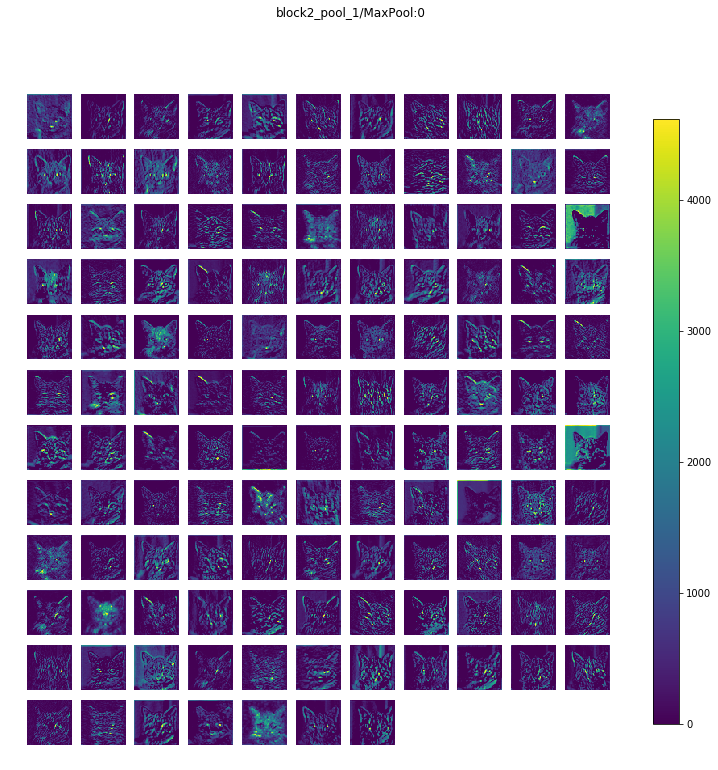

block3_conv1_1/Relu:0 (1, 56, 56, 256) 


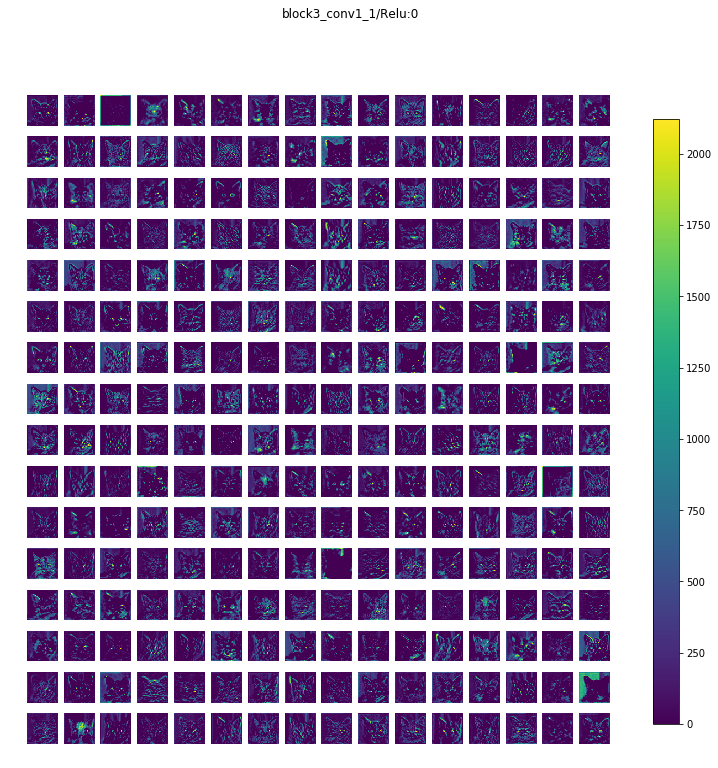

block3_conv2_1/Relu:0 (1, 56, 56, 256) 


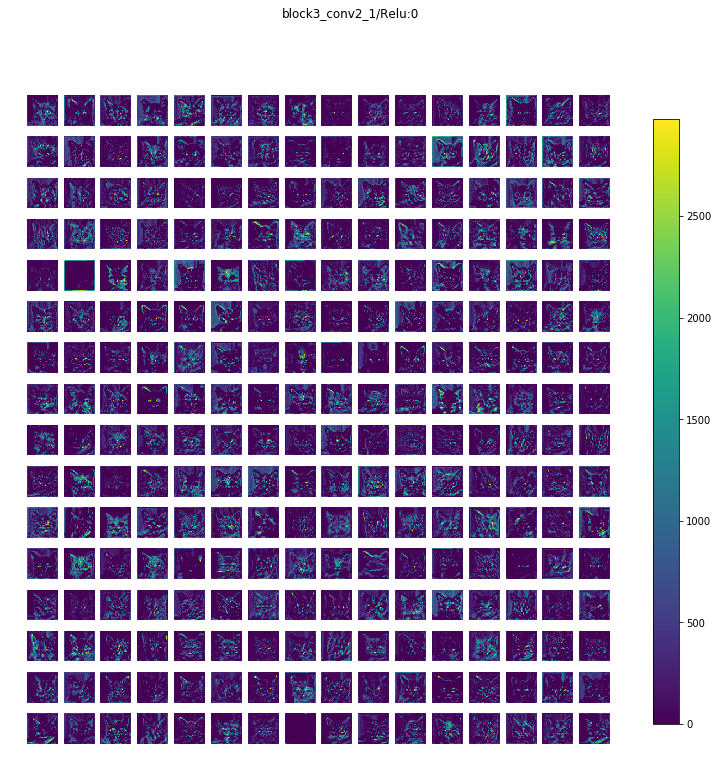

block3_conv3_1/Relu:0 (1, 56, 56, 256) 


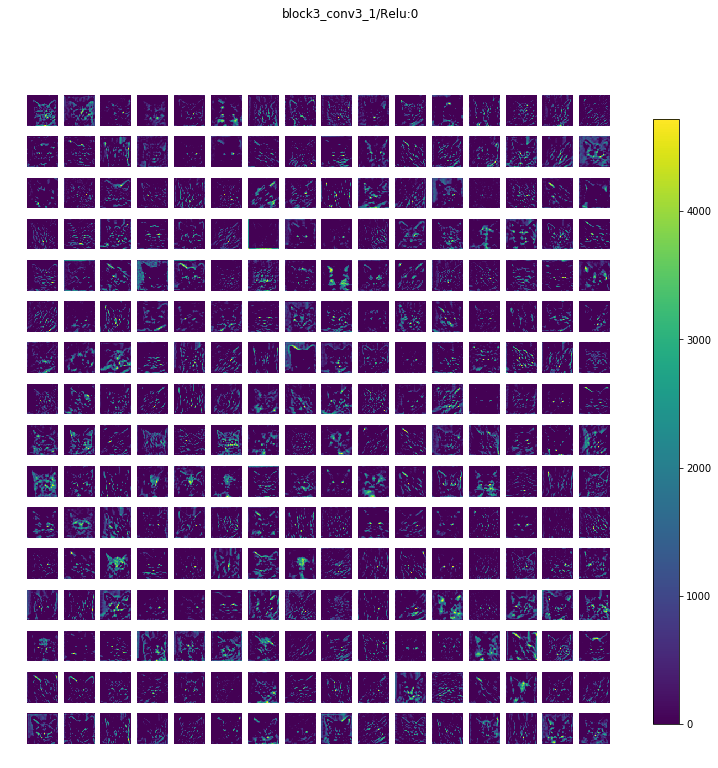

block3_pool_1/MaxPool:0 (1, 28, 28, 256) 


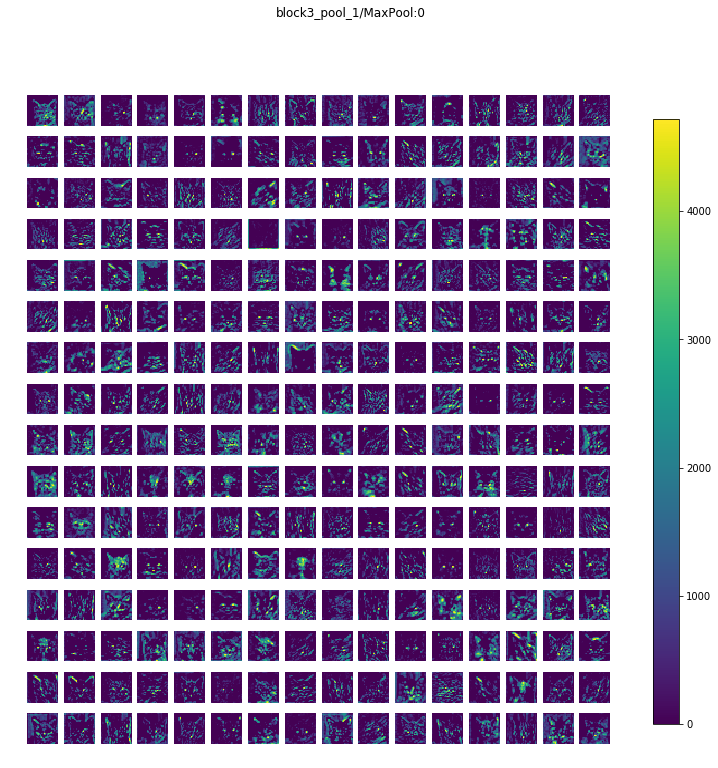

block4_conv1_1/Relu:0 (1, 28, 28, 512) 


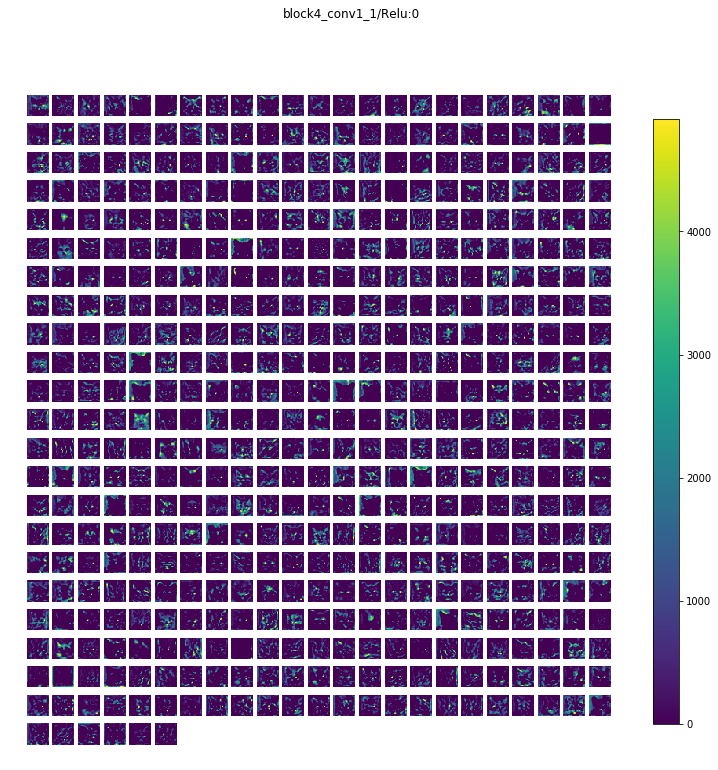

block4_conv2_1/Relu:0 (1, 28, 28, 512) 


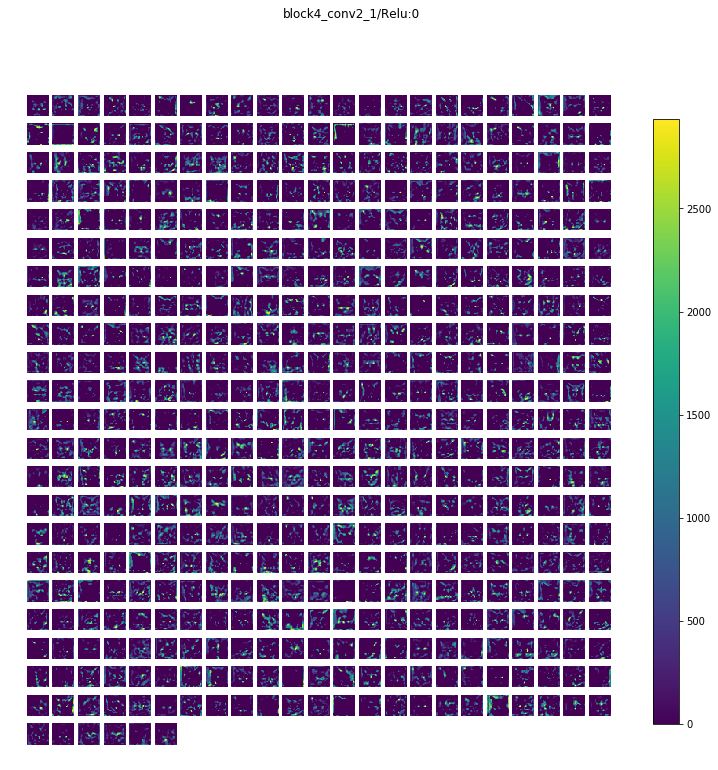

block4_conv3_1/Relu:0 (1, 28, 28, 512) 


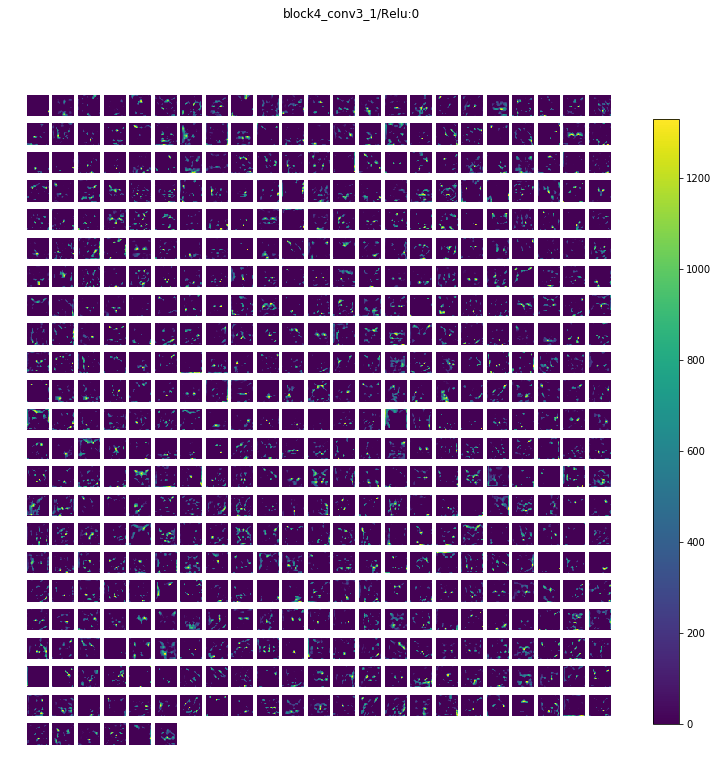

block4_pool_1/MaxPool:0 (1, 14, 14, 512) 


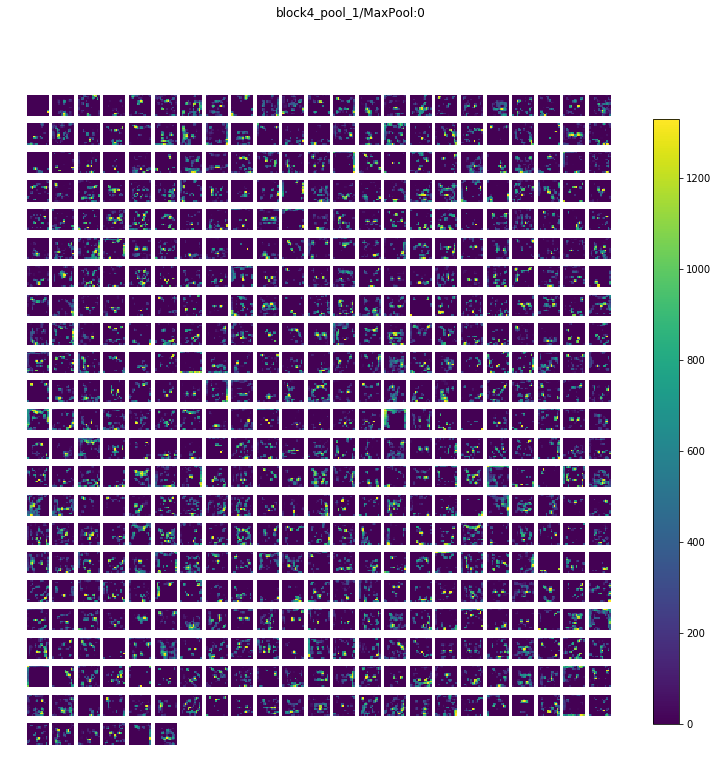

block5_conv1_1/Relu:0 (1, 14, 14, 512) 


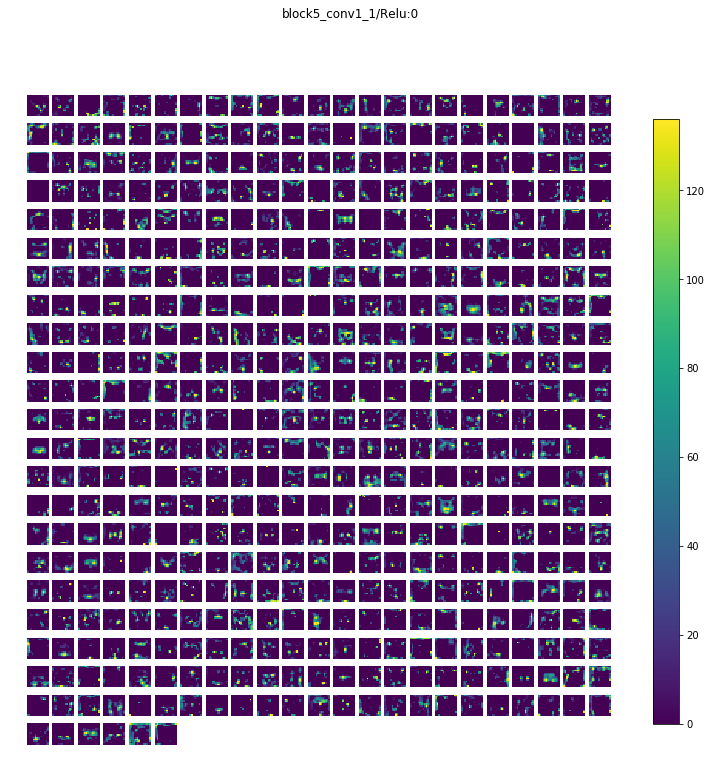

block5_conv2_1/Relu:0 (1, 14, 14, 512) 


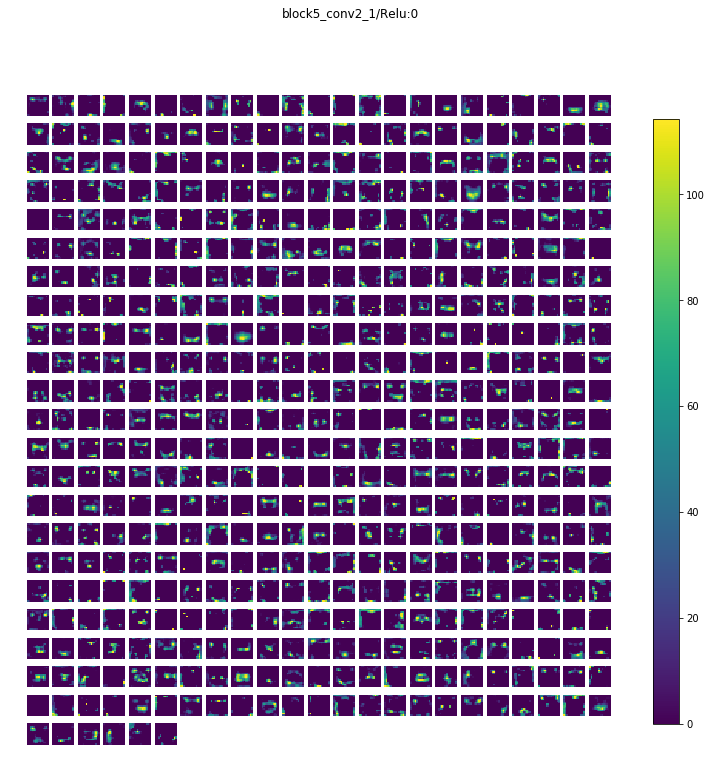

block5_conv3_1/Relu:0 (1, 14, 14, 512) 


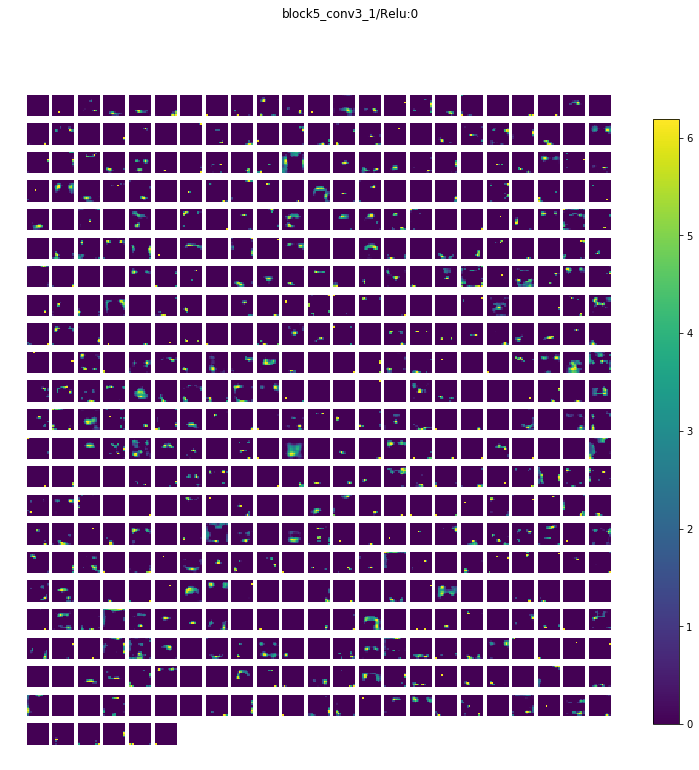

block5_pool_1/MaxPool:0 (1, 7, 7, 512) 


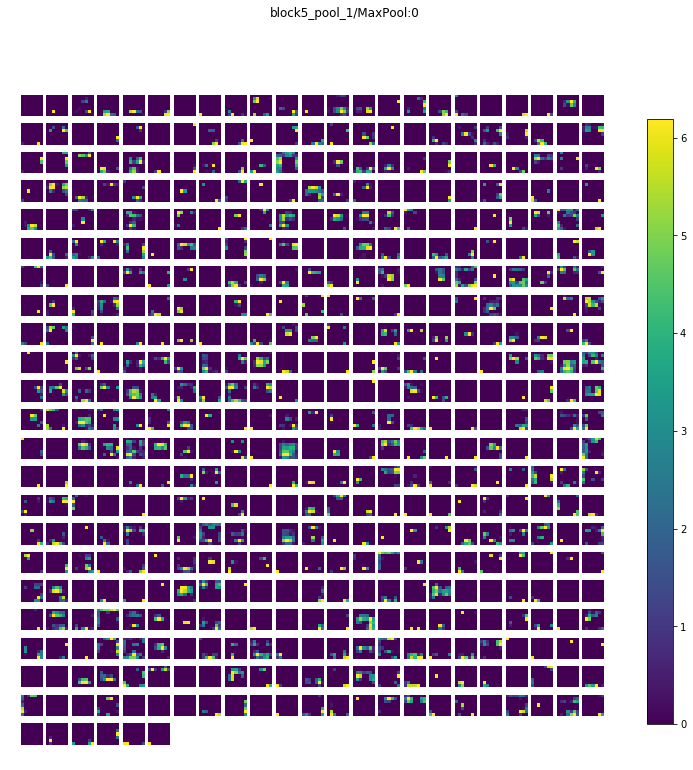

flatten_1/Reshape:0 (1, 25088) -> Skipped. 2D Activations.
fc1_1/Relu:0 (1, 4096) -> Skipped. 2D Activations.
fc2_1/Relu:0 (1, 4096) -> Skipped. 2D Activations.
predictions_1/Softmax:0 (1, 1000) -> Skipped. 2D Activations.


In [0]:
from keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import decode_predictions
from keras.applications.vgg16 import preprocess_input
from keras.preprocessing.image import img_to_array

model = VGG16()

from PIL import Image
import requests
from io import BytesIO

url = 'https://upload.wikimedia.org/wikipedia/commons/thumb/1/14/Gatto_europeo4.jpg/250px-Gatto_europeo4.jpg'
response = requests.get(url)
image = Image.open(BytesIO(response.content))
image = image.crop((0, 0, 224, 224))
image = img_to_array(image)
image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))
image = preprocess_input(image)
yhat = model.predict(image)
label = decode_predictions(yhat)
label = label[0][0]
print('{} ({})'.format(label[1], label[2] * 100))

import keract

model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])
activations = keract.get_activations(model, image)
first = activations.get('block1_conv1/Relu:0')
keract.display_activations(activations)

Processing similar for Provided image on url https://media.karousell.com/media/photos/products/2018/08/20/16_scale_tony_stark_avenger3_headscrupt_with_glasses_1534759826_e79b0cf4.jpg

W0720 12:37:53.480068 140139485300608 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/optimizers.py:790: The name tf.train.Optimizer is deprecated. Please use tf.compat.v1.train.Optimizer instead.



hair_spray (13.448245823383331)
input_3:0 (224, 224, 3) -> Skipped. First dimension is not 1.
block1_conv1_2/Relu:0 (1, 224, 224, 64) 


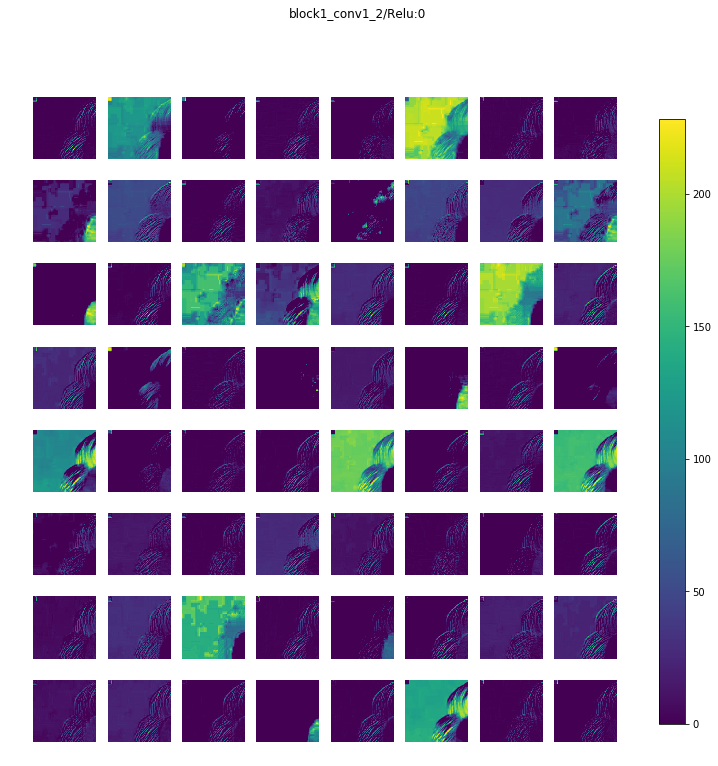

block1_conv2_2/Relu:0 (1, 224, 224, 64) 


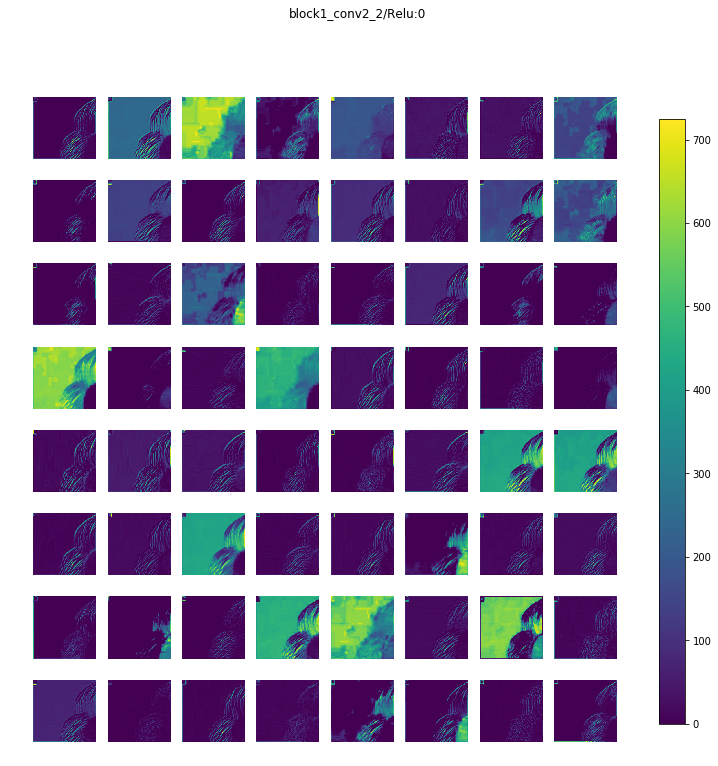

block1_pool_2/MaxPool:0 (1, 112, 112, 64) 


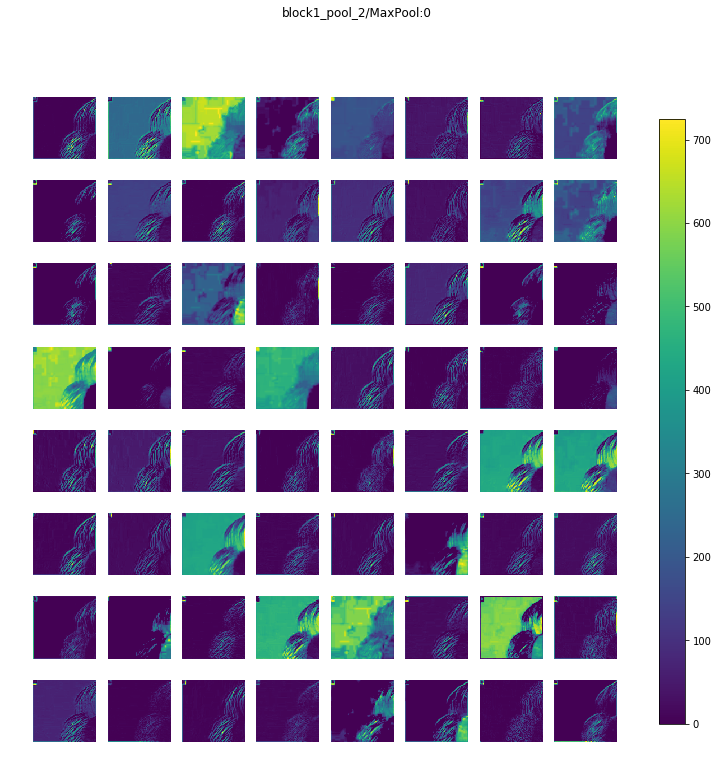

block2_conv1_2/Relu:0 (1, 112, 112, 128) 


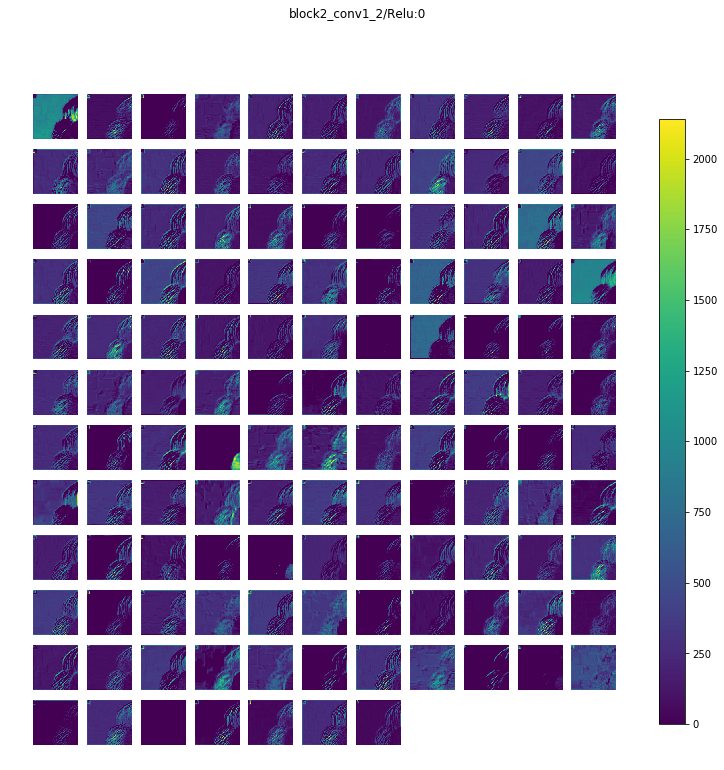

block2_conv2_2/Relu:0 (1, 112, 112, 128) 


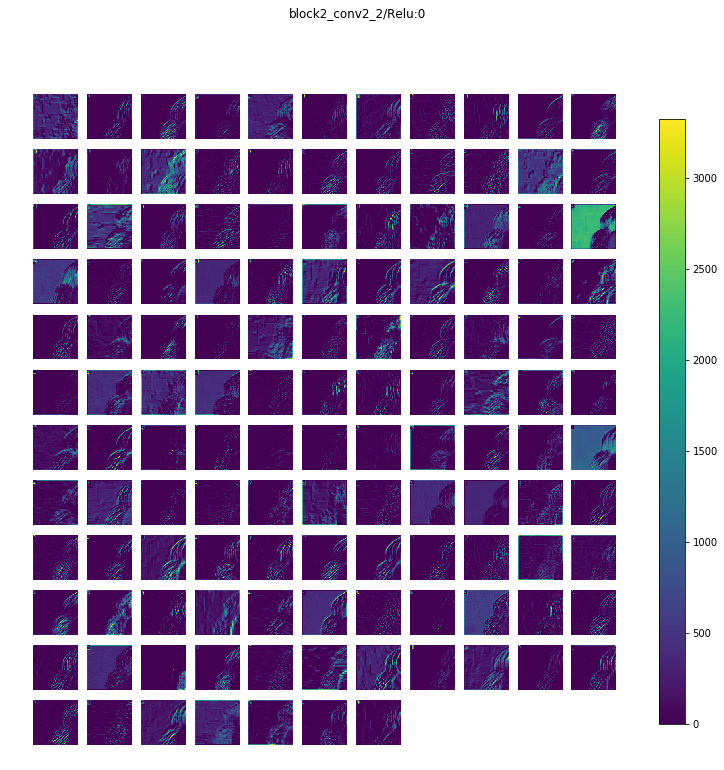

block2_pool_2/MaxPool:0 (1, 56, 56, 128) 


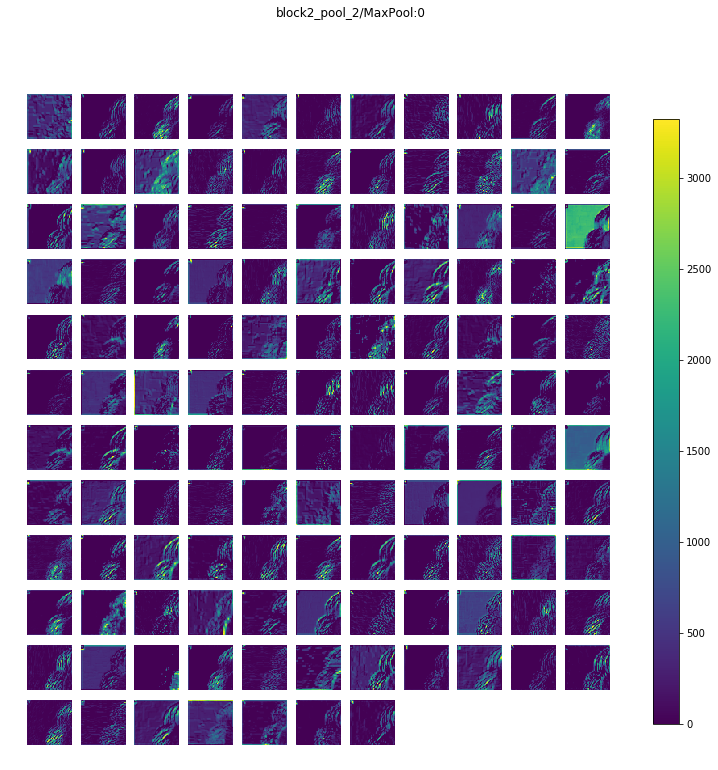

block3_conv1_2/Relu:0 (1, 56, 56, 256) 


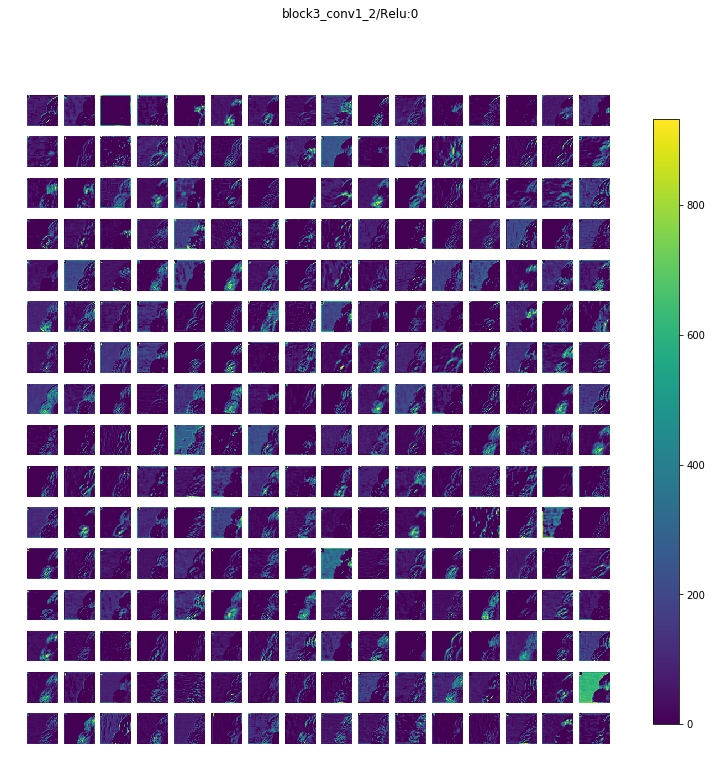

block3_conv2_2/Relu:0 (1, 56, 56, 256) 


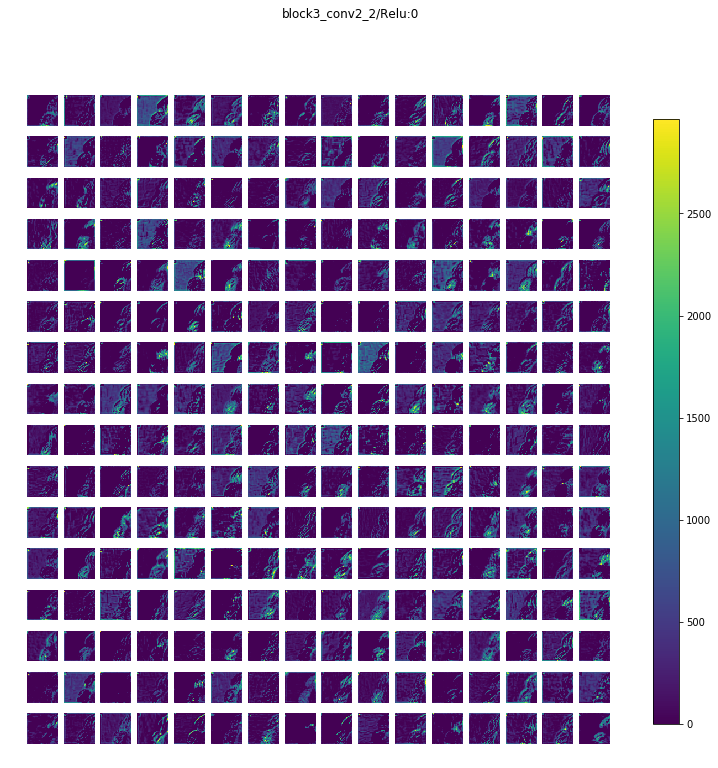

block3_conv3_2/Relu:0 (1, 56, 56, 256) 


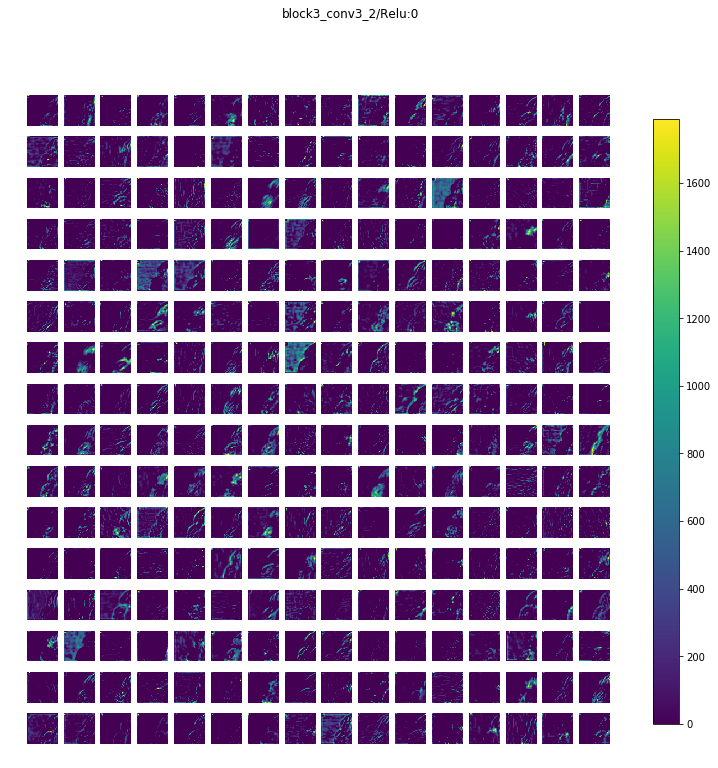

block3_pool_2/MaxPool:0 (1, 28, 28, 256) 


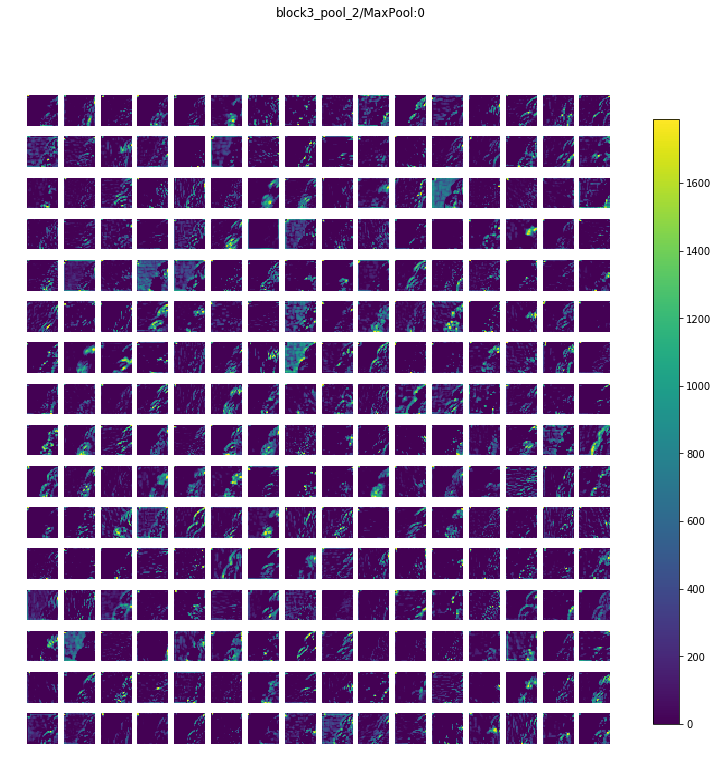

block4_conv1_2/Relu:0 (1, 28, 28, 512) 


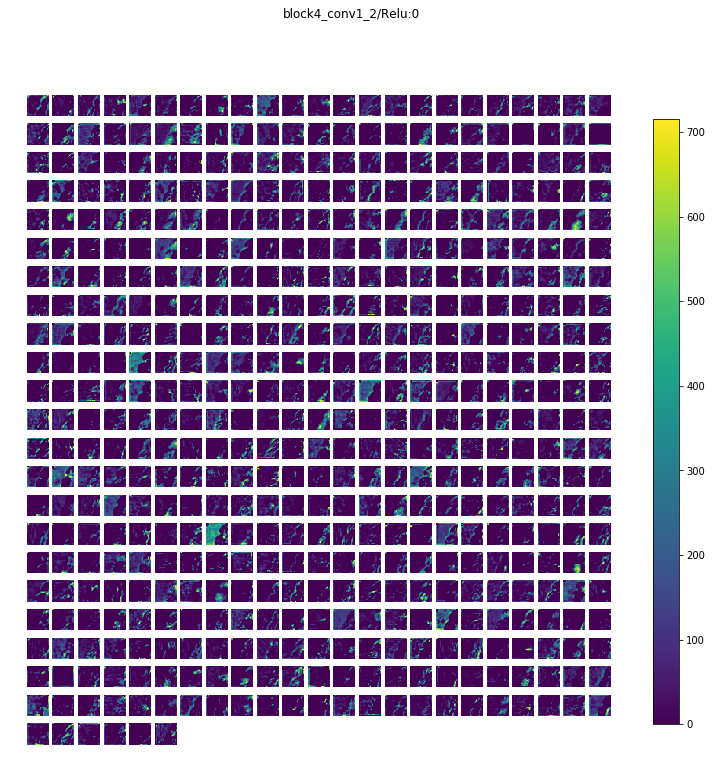

block4_conv2_2/Relu:0 (1, 28, 28, 512) 


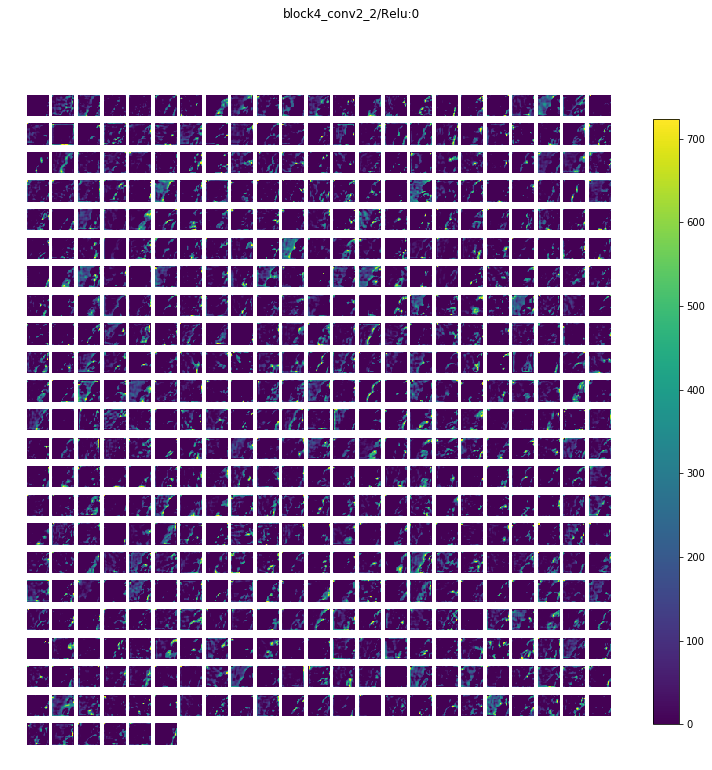

block4_conv3_2/Relu:0 (1, 28, 28, 512) 


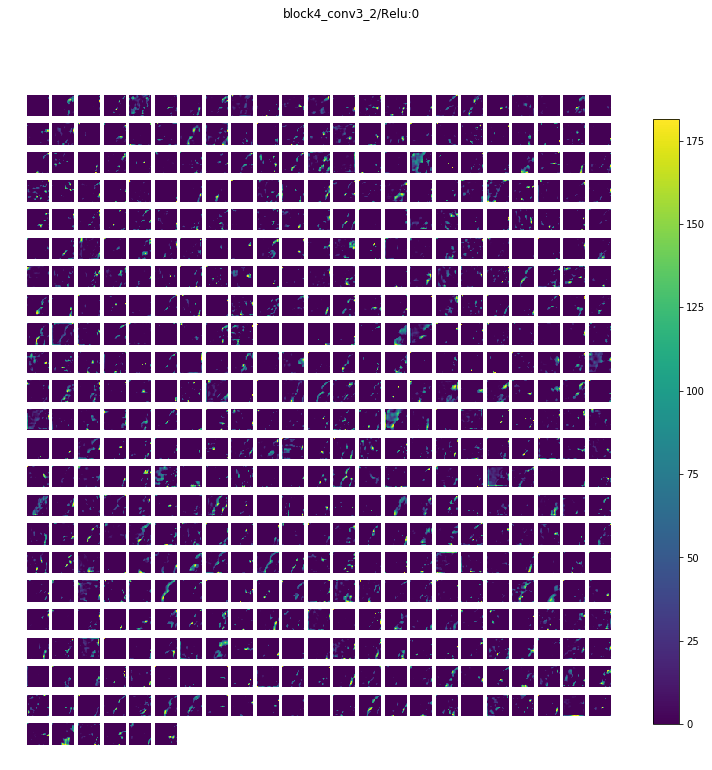

block4_pool_2/MaxPool:0 (1, 14, 14, 512) 


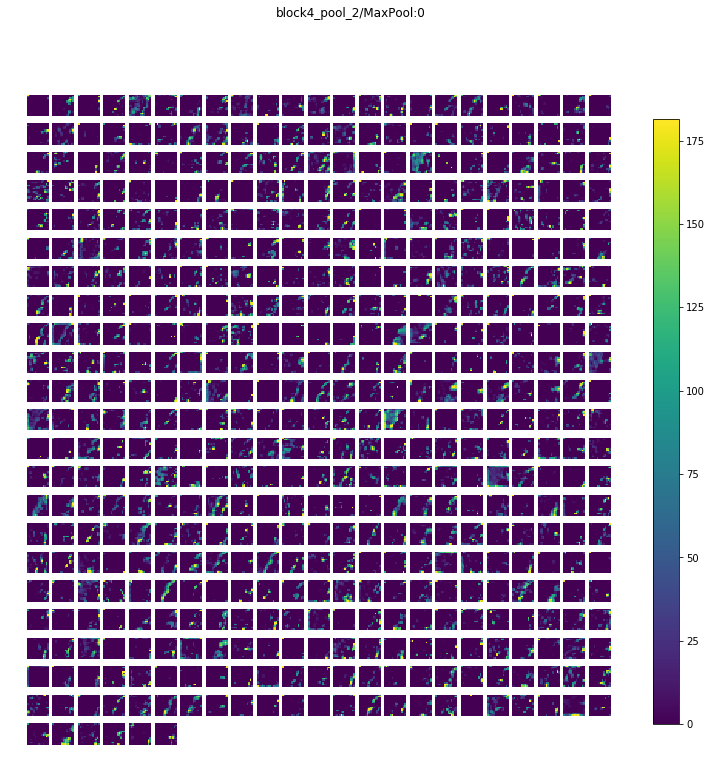

block5_conv1_2/Relu:0 (1, 14, 14, 512) 


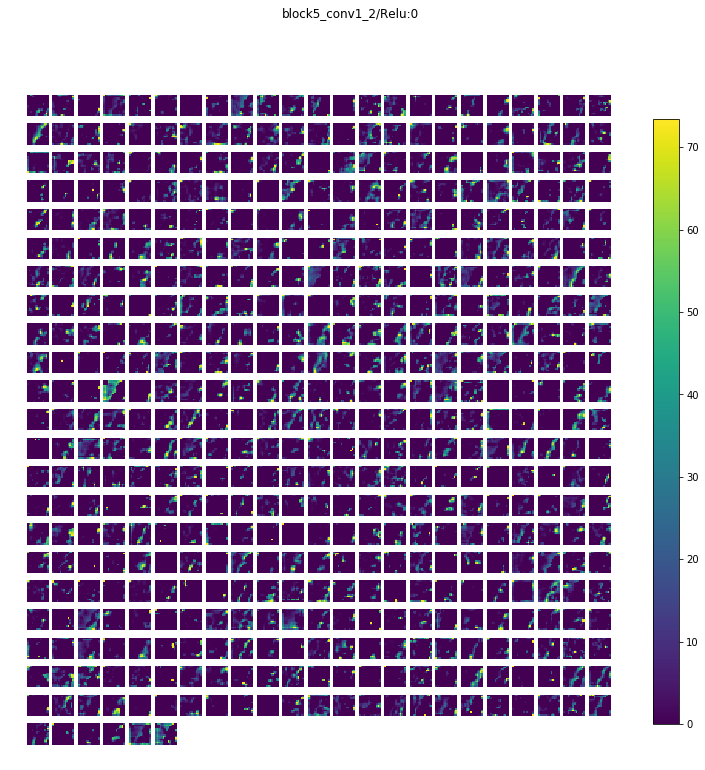

block5_conv2_2/Relu:0 (1, 14, 14, 512) 


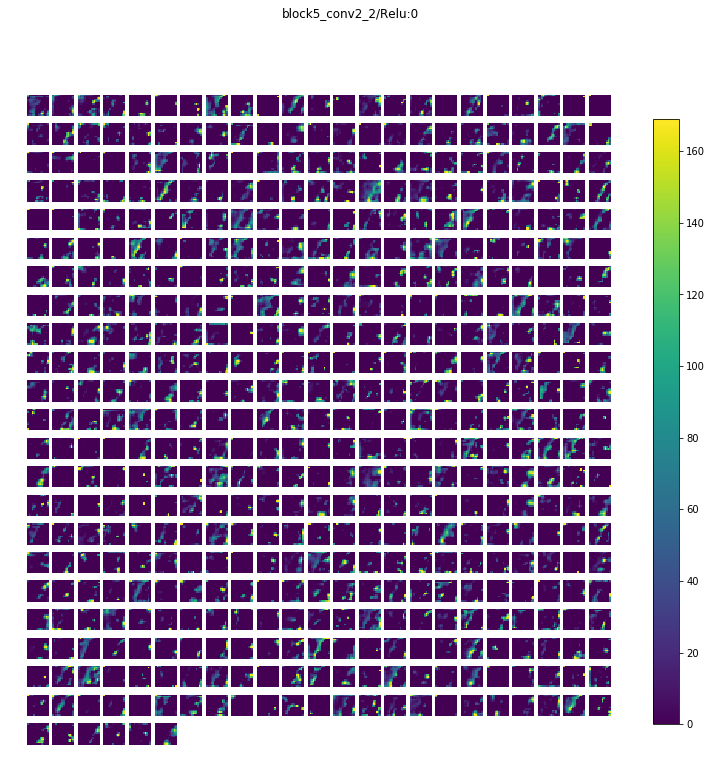

block5_conv3_2/Relu:0 (1, 14, 14, 512) 


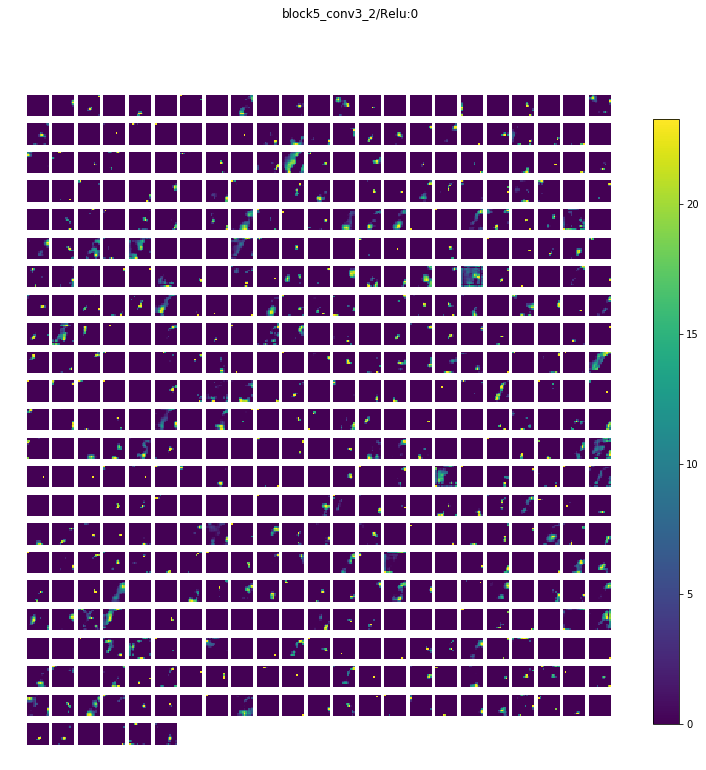

block5_pool_2/MaxPool:0 (1, 7, 7, 512) 


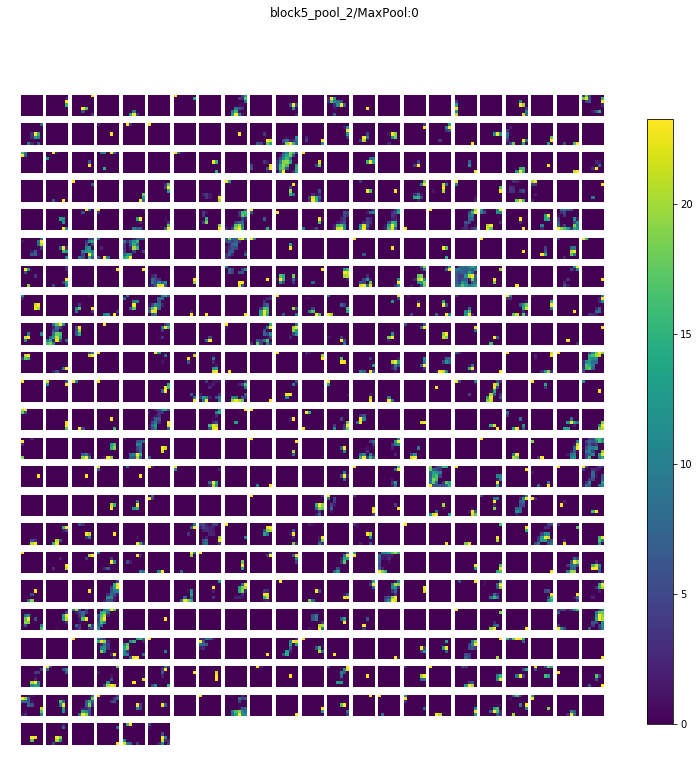

flatten_2/Reshape:0 (1, 25088) -> Skipped. 2D Activations.
fc1_2/Relu:0 (1, 4096) -> Skipped. 2D Activations.
fc2_2/Relu:0 (1, 4096) -> Skipped. 2D Activations.
predictions_2/Softmax:0 (1, 1000) -> Skipped. 2D Activations.


In [14]:
from keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import decode_predictions
from keras.applications.vgg16 import preprocess_input
from keras.preprocessing.image import img_to_array

model = VGG16()

from PIL import Image
import requests
from io import BytesIO

url = 'https://media.karousell.com/media/photos/products/2018/08/20/16_scale_tony_stark_avenger3_headscrupt_with_glasses_1534759826_e79b0cf4.jpg'
#'https://upload.wikimedia.org/wikipedia/commons/thumb/1/14/Gatto_europeo4.jpg/250px-Gatto_europeo4.jpg'
response = requests.get(url)
image = Image.open(BytesIO(response.content))
image = image.crop((0, 0, 224, 224))
image = img_to_array(image)
image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))
image = preprocess_input(image)
yhat = model.predict(image)
label = decode_predictions(yhat)
label = label[0][0]
print('{} ({})'.format(label[1], label[2] * 100))

import keract

model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])
activations = keract.get_activations(model, image)
first = activations.get('block1_conv1/Relu:0')
keract.display_activations(activations)